<a href="https://colab.research.google.com/github/sumitjhadev/Generative-Adversarial-Network-GAN-/blob/main/gan_pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 align="center">🎭 Generating Faces with a DCGAN</h1>
<p align="center"><i>A convolutional GAN built from scratch in PyTorch and trained on CelebA</i></p>

<p align="center">
  <a href="https://colab.research.google.com/github/sumitjhadev/gan-celeba/blob/main/gan_pipeline.ipynb">
    <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab">
  </a>
</p>

---

## Overview

A **Generative Adversarial Network (GAN)** is two networks playing a game:

| Player | Job |
|---|---|
| **Generator (G)** | Turns random noise into a fake image, trying to fool the critic |
| **Discriminator (D)** | Looks at an image and says how likely it is to be real |

As they compete, G learns to produce faces that D can no longer tell apart from real ones.

**What this notebook does**

1. Downloads and preprocesses the CelebA face dataset (64×64, RGB)
2. Builds a **DCGAN** (Radford et al., 2015): transposed-conv generator, strided-conv discriminator
3. Trains it with a fixed noise vector so you can *watch the same faces improve* epoch by epoch
4. Visualises the results: loss curves, real vs. generated faces, a training GIF and latent-space morphing

> **Runtime:** use a GPU (`Runtime → Change runtime type → T4 GPU`). 30 epochs takes roughly 10–15 minutes.

## 1 · Setup

All hyper-parameters live in one place so experiments are easy to reproduce.

In [ ]:
%pip install -q kagglehub

In [ ]:
import os
import glob
import random
import shutil

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm   # plain tqdm (not tqdm.auto) so GitHub can render the saved notebook

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from IPython.display import Image as IPyImage, display

# ------------------------------------------------------------------ config
CONFIG = {
    "seed": 42,
    "img_size": 64,          # images are resized to 64x64
    "z_dim": 100,            # length of the noise vector fed to G
    "batch_size": 128,
    "epochs": 30,            # 5 = smoke test, 30-50 = recognisable faces
    "lr": 2e-4,
    "beta1": 0.5,            # Adam beta1 (0.5 is the DCGAN default)
    "real_label": 0.9,       # one-sided label smoothing for D (stabilises training)
    "num_workers": 2,
    "show_every": 5,         # display a sample grid every N epochs
    "save_every": 5,         # save a generator checkpoint every N epochs
    "data_dir": None,        # set a folder path to skip the Kaggle download
}

# folders written by this notebook
SAMPLES_DIR = "outputs/samples"   # one image per epoch (used for the GIF)
CKPT_DIR = "checkpoints"          # model weights
ASSETS_DIR = "assets"             # final figures for the README
for d in (SAMPLES_DIR, CKPT_DIR, ASSETS_DIR):
    os.makedirs(d, exist_ok=True)

# ------------------------------------------------------------ reproducibility
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(CONFIG["seed"])

# ------------------------------------------------------------------ device
if torch.cuda.is_available():
    device = torch.device("cuda")
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")
if device.type == "cpu":
    print("⚠️  No GPU found. In Colab: Runtime → Change runtime type → T4 GPU")

# ------------------------------------------------------------ plot styling
plt.rcParams.update({
    "figure.facecolor": "#0f1117",
    "axes.facecolor": "#0f1117",
    "savefig.facecolor": "#0f1117",
    "axes.edgecolor": "#3a3f4b",
    "axes.labelcolor": "#e6e6e6",
    "text.color": "#e6e6e6",
    "xtick.color": "#b0b3ba",
    "ytick.color": "#b0b3ba",
    "axes.grid": True,
    "grid.color": "#232733",
    "font.size": 11,
    "axes.titlesize": 13,
    "axes.titleweight": "bold",
})

Using device: cuda


## 2 · Data

We use the **CelebA** aligned faces from Kaggle (a 30k-image subset in this mirror).

Preprocessing:
- **CenterCrop(178)**: the originals are 178×218, so this keeps a square around the face
- **Resize(64)**: small enough to train fast, big enough to see faces
- **Normalize to [-1, 1]**: matches the generator's `Tanh` output range

In [ ]:
def find_image_dir(root):
    # Return the folder under `root` that contains the most images.
    best_dir, best_n = None, 0
    for dirpath, _, files in os.walk(root):
        n = sum(f.lower().endswith((".jpg", ".jpeg", ".png")) for f in files)
        if n > best_n:
            best_dir, best_n = dirpath, n
    if best_dir is None:
        raise FileNotFoundError(f"No images found under {root}")
    return best_dir, best_n


if CONFIG["data_dir"] is None:
    import kagglehub
    print("Downloading CelebA from Kaggle (cached after the first run)...")
    root = kagglehub.dataset_download("yunting0123/img-align-celeba")
else:
    root = CONFIG["data_dir"]

DATA_DIR, n_found = find_image_dir(root)
print(f"Found {n_found:,} images in: {DATA_DIR}")

100%|██████████| 246M/246M [00:03<00:00, 84.0MB/s]

Extracting files...


Found 30,000 images in: /root/.cache/kagglehub/datasets/yunting0123/img-align-celeba/versions/1/t/celebA


In [ ]:
class CelebADataset(Dataset):
    # Loads face images from a folder and applies the given transforms.

    def __init__(self, root_dir, transform=None):
        self.transform = transform
        self.paths = sorted(
            os.path.join(root_dir, f)
            for f in os.listdir(root_dir)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        )

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img


transform = transforms.Compose([
    transforms.CenterCrop(178),                      # 178x218 -> 178x178
    transforms.Resize((CONFIG["img_size"],) * 2),    # -> 64x64
    transforms.ToTensor(),                           # [0, 255] -> [0, 1]
    transforms.Normalize((0.5,) * 3, (0.5,) * 3),    # [0, 1]   -> [-1, 1]
])

dataset = CelebADataset(DATA_DIR, transform)
dataloader = DataLoader(
    dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=True,
    num_workers=CONFIG["num_workers"],
    pin_memory=(device.type == "cuda"),
    drop_last=True,   # avoids a tiny last batch (keeps BatchNorm happy)
)
print(f"Dataset: {len(dataset):,} images  |  {len(dataloader)} batches per epoch")

Dataset: 30,000 images  |  234 batches per epoch


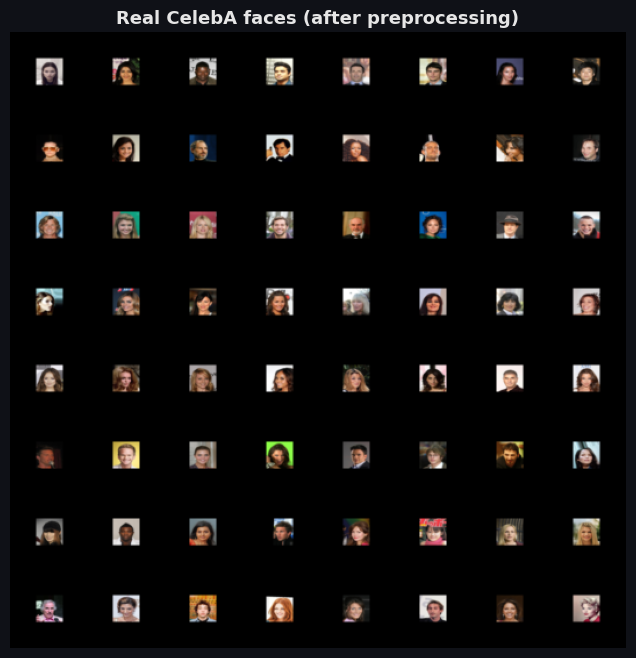

In [ ]:
def show_grid(images, title="", nrow=8, save_path=None, figsize=(8, 8)):
    # Show (and optionally save) a grid of images that live in [-1, 1].
    grid = vutils.make_grid(images, nrow=nrow, padding=2, normalize=True, value_range=(-1, 1))
    plt.figure(figsize=figsize)
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis("off")
    plt.title(title)
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()


real_batch = next(iter(dataloader))
show_grid(real_batch[:64], "Real CelebA faces (after preprocessing)")

## 3 · Models

### Why not the fully-connected version?
A plain MLP GAN flattens the image into a long vector and throws away the 2-D structure, so it tends to output
blurry, noisy blobs. **Convolutions** share weights across the image and capture local patterns (edges → eyes → faces),
which is why DCGAN became the standard baseline.

### Generator
Noise `(100,)` is reshaped to `(100, 1, 1)` and **up-sampled** with transposed convolutions:

```
100×1×1 → 512×4×4 → 256×8×8 → 128×16×16 → 64×32×32 → 3×64×64
```
`BatchNorm + ReLU` in the hidden layers, `Tanh` at the end so pixels land in [-1, 1].

### Discriminator
The mirror image: **strided convolutions** shrink the image down to a single probability.

```
3×64×64 → 64×32×32 → 128×16×16 → 256×8×8 → 512×4×4 → 1
```
`LeakyReLU(0.2)` keeps gradients alive for negative inputs, and `Sigmoid` gives P(real).

In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, ch=64):
        super().__init__()
        self.net = nn.Sequential(
            # 1x1 -> 4x4
            nn.ConvTranspose2d(z_dim, ch * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ch * 8), nn.ReLU(True),
            # 4x4 -> 8x8
            nn.ConvTranspose2d(ch * 8, ch * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ch * 4), nn.ReLU(True),
            # 8x8 -> 16x16
            nn.ConvTranspose2d(ch * 4, ch * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ch * 2), nn.ReLU(True),
            # 16x16 -> 32x32
            nn.ConvTranspose2d(ch * 2, ch, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ch), nn.ReLU(True),
            # 32x32 -> 64x64
            nn.ConvTranspose2d(ch, 3, 4, 2, 1, bias=False),
            nn.Tanh(),                                   # pixels in [-1, 1]
        )

    def forward(self, z):
        return self.net(z.view(z.size(0), -1, 1, 1))


class Discriminator(nn.Module):
    def __init__(self, ch=64):
        super().__init__()
        self.net = nn.Sequential(
            # 64x64 -> 32x32   (no BatchNorm on the first layer, as in the DCGAN paper)
            nn.Conv2d(3, ch, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, True),
            # 32x32 -> 16x16
            nn.Conv2d(ch, ch * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ch * 2), nn.LeakyReLU(0.2, True),
            # 16x16 -> 8x8
            nn.Conv2d(ch * 2, ch * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ch * 4), nn.LeakyReLU(0.2, True),
            # 8x8 -> 4x4
            nn.Conv2d(ch * 4, ch * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ch * 8), nn.LeakyReLU(0.2, True),
            # 4x4 -> 1x1
            nn.Conv2d(ch * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),                                # P(real)
        )

    def forward(self, x):
        return self.net(x).view(-1, 1)


def weights_init(m):
    # DCGAN initialisation: weights ~ N(0, 0.02), BatchNorm scale ~ N(1, 0.02).
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight, 0.0, 0.02)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.zeros_(m.bias)


generator = Generator(CONFIG["z_dim"]).to(device)
discriminator = Discriminator().to(device)
generator.apply(weights_init)
discriminator.apply(weights_init)

count = lambda m: sum(p.numel() for p in m.parameters())
print(f"Generator      : {count(generator):>10,} parameters")
print(f"Discriminator  : {count(discriminator):>10,} parameters")

# quick shape sanity check
with torch.no_grad():
    z = torch.randn(4, CONFIG["z_dim"], device=device)
    assert generator(z).shape == (4, 3, 64, 64)
    assert discriminator(generator(z)).shape == (4, 1)
print("Shape check passed ✅")

Generator      :  3,576,704 parameters
Discriminator  :  2,765,568 parameters
Shape check passed ✅


## 4 · Training

Each iteration has two steps:

1. **Train D**: show it a batch of real faces (target ≈ 1) and a batch of fakes (target 0).
   The fakes are passed through `.detach()` so this step doesn't update G.
2. **Train G**: pass fresh fakes through D and reward G when D says "real" (target 1).

Two details that make this more stable and easier to interpret:

- **Fixed noise:** the same 64 noise vectors are rendered after every epoch, so the images show G *improving* rather than random new samples.
- **One-sided label smoothing:** D's "real" target is 0.9 instead of 1.0, which stops D from becoming overconfident.

We also log `D(x)` (D's average score on real images) and `D(G(z))` (its score on fakes). In a healthy run both hover around 0.5 and neither network wins outright.

In [ ]:
criterion = nn.BCELoss()
g_optimizer = optim.Adam(generator.parameters(), lr=CONFIG["lr"], betas=(CONFIG["beta1"], 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=CONFIG["lr"], betas=(CONFIG["beta1"], 0.999))

# same noise every epoch -> comparable progress images
fixed_noise = torch.randn(64, CONFIG["z_dim"], device=device)

history = {"g_loss": [], "d_loss": [], "d_x": [], "d_gz": []}

In [ ]:
def train(epochs):
    for epoch in range(1, epochs + 1):
        pbar = tqdm(dataloader, desc=f"Epoch {epoch}/{epochs}", leave=False)

        for real in pbar:
            real = real.to(device, non_blocking=True)
            b = real.size(0)
            real_labels = torch.full((b, 1), CONFIG["real_label"], device=device)  # 0.9 (smoothed)
            fake_labels = torch.zeros(b, 1, device=device)
            g_target = torch.ones(b, 1, device=device)                             # G wants D to say 1

            # ---------- 1) Discriminator step ----------
            d_optimizer.zero_grad(set_to_none=True)
            fake = generator(torch.randn(b, CONFIG["z_dim"], device=device))

            out_real = discriminator(real)
            out_fake = discriminator(fake.detach())   # detach: don't backprop into G here
            d_loss = 0.5 * (criterion(out_real, real_labels) + criterion(out_fake, fake_labels))
            d_loss.backward()
            d_optimizer.step()

            # ---------- 2) Generator step ----------
            g_optimizer.zero_grad(set_to_none=True)
            g_loss = criterion(discriminator(fake), g_target)   # D was just updated, so re-score
            g_loss.backward()
            g_optimizer.step()

            # ---------- logging ----------
            history["g_loss"].append(g_loss.item())
            history["d_loss"].append(d_loss.item())
            history["d_x"].append(out_real.mean().item())
            history["d_gz"].append(out_fake.mean().item())
            pbar.set_postfix(G=f"{g_loss.item():.2f}", D=f"{d_loss.item():.2f}",
                             Dx=f"{out_real.mean().item():.2f}", DGz=f"{out_fake.mean().item():.2f}")

        # ---------- end of epoch: save progress ----------
        with torch.no_grad():
            samples = generator(fixed_noise).cpu()
        vutils.save_image(samples, f"{SAMPLES_DIR}/epoch_{epoch:03d}.png", nrow=8,
                          padding=2, normalize=True, value_range=(-1, 1))

        if epoch % CONFIG["save_every"] == 0 or epoch == epochs:
            torch.save(generator.state_dict(), f"{CKPT_DIR}/generator_epoch_{epoch:03d}.pt")
            torch.save(generator.state_dict(), f"{CKPT_DIR}/generator_latest.pt")
            torch.save(discriminator.state_dict(), f"{CKPT_DIR}/discriminator_latest.pt")

        print(f"Epoch {epoch:>2}/{epochs}  |  G-loss {np.mean(history['g_loss'][-len(dataloader):]):.3f}"
              f"  |  D-loss {np.mean(history['d_loss'][-len(dataloader):]):.3f}"
              f"  |  D(x) {np.mean(history['d_x'][-len(dataloader):]):.2f}"
              f"  |  D(G(z)) {np.mean(history['d_gz'][-len(dataloader):]):.2f}")

        if epoch == 1 or epoch % CONFIG["show_every"] == 0 or epoch == epochs:
            show_grid(samples, f"Generated faces: epoch {epoch}", figsize=(6, 6))

Epoch  1/30  |  G-loss 7.532  |  D-loss 0.438  |  D(x) 0.80  |  D(G(z)) 0.12


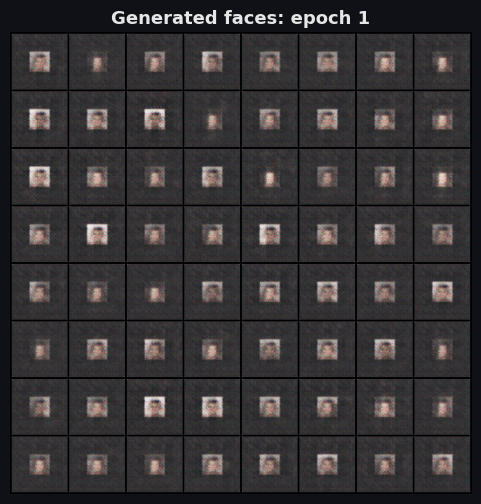

Epoch  2/30  |  G-loss 3.704  |  D-loss 0.517  |  D(x) 0.66  |  D(G(z)) 0.24


Epoch  3/30  |  G-loss 3.120  |  D-loss 0.525  |  D(x) 0.63  |  D(G(z)) 0.27


Epoch  4/30  |  G-loss 3.012  |  D-loss 0.527  |  D(x) 0.62  |  D(G(z)) 0.28


Epoch  5/30  |  G-loss 2.783  |  D-loss 0.552  |  D(x) 0.60  |  D(G(z)) 0.30


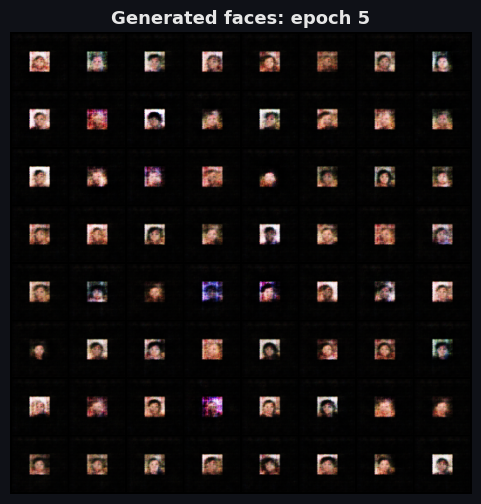

Epoch  6/30  |  G-loss 2.640  |  D-loss 0.526  |  D(x) 0.60  |  D(G(z)) 0.29


Epoch  7/30  |  G-loss 2.395  |  D-loss 0.564  |  D(x) 0.58  |  D(G(z)) 0.31


Epoch  8/30  |  G-loss 2.317  |  D-loss 0.567  |  D(x) 0.58  |  D(G(z)) 0.32


Epoch  9/30  |  G-loss 2.263  |  D-loss 0.560  |  D(x) 0.58  |  D(G(z)) 0.32


Epoch 10/30  |  G-loss 2.256  |  D-loss 0.564  |  D(x) 0.58  |  D(G(z)) 0.32


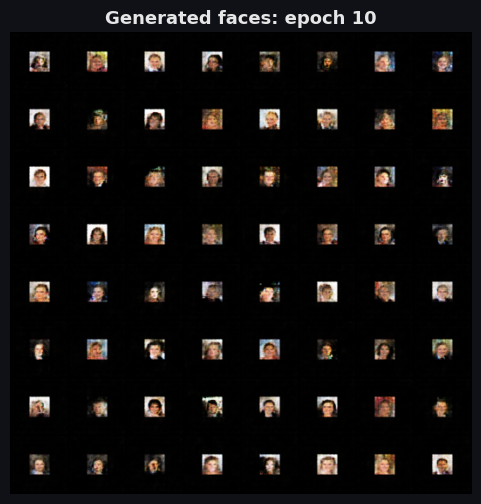

Epoch 11/30  |  G-loss 2.230  |  D-loss 0.556  |  D(x) 0.58  |  D(G(z)) 0.32


Epoch 12/30  |  G-loss 2.222  |  D-loss 0.551  |  D(x) 0.58  |  D(G(z)) 0.32


Epoch 13/30  |  G-loss 2.170  |  D-loss 0.552  |  D(x) 0.58  |  D(G(z)) 0.32


Epoch 14/30  |  G-loss 2.105  |  D-loss 0.553  |  D(x) 0.58  |  D(G(z)) 0.32


Epoch 15/30  |  G-loss 2.160  |  D-loss 0.542  |  D(x) 0.58  |  D(G(z)) 0.31


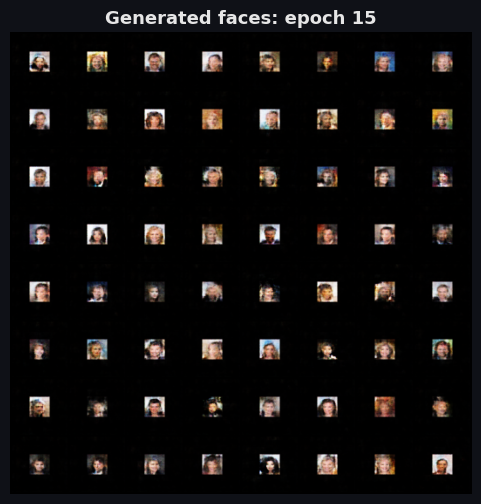

Epoch 16/30  |  G-loss 2.162  |  D-loss 0.544  |  D(x) 0.58  |  D(G(z)) 0.31


Epoch 17/30  |  G-loss 2.077  |  D-loss 0.545  |  D(x) 0.59  |  D(G(z)) 0.31


Epoch 18/30  |  G-loss 2.174  |  D-loss 0.531  |  D(x) 0.59  |  D(G(z)) 0.31


Epoch 19/30  |  G-loss 2.158  |  D-loss 0.528  |  D(x) 0.59  |  D(G(z)) 0.30


Epoch 20/30  |  G-loss 2.192  |  D-loss 0.523  |  D(x) 0.60  |  D(G(z)) 0.30


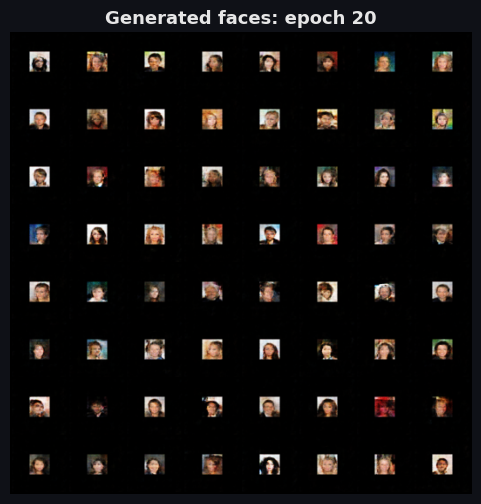

Epoch 21/30  |  G-loss 2.168  |  D-loss 0.521  |  D(x) 0.60  |  D(G(z)) 0.30


Epoch 22/30  |  G-loss 2.201  |  D-loss 0.515  |  D(x) 0.60  |  D(G(z)) 0.30


Epoch 23/30  |  G-loss 2.214  |  D-loss 0.517  |  D(x) 0.60  |  D(G(z)) 0.30


Epoch 24/30  |  G-loss 2.206  |  D-loss 0.509  |  D(x) 0.61  |  D(G(z)) 0.29


Epoch 25/30  |  G-loss 2.173  |  D-loss 0.508  |  D(x) 0.61  |  D(G(z)) 0.29


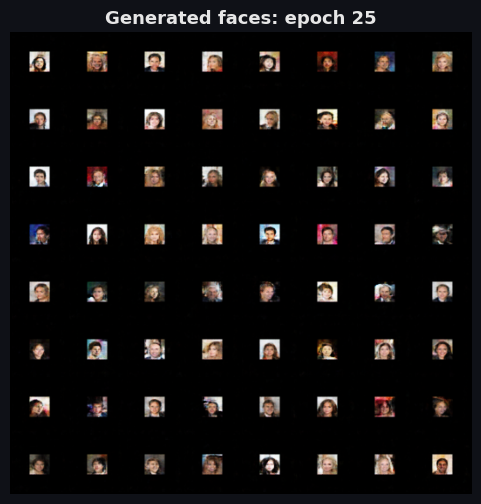

Epoch 26/30  |  G-loss 2.265  |  D-loss 0.499  |  D(x) 0.61  |  D(G(z)) 0.29


Epoch 27/30  |  G-loss 2.250  |  D-loss 0.509  |  D(x) 0.61  |  D(G(z)) 0.29


Epoch 28/30  |  G-loss 2.240  |  D-loss 0.492  |  D(x) 0.62  |  D(G(z)) 0.28


Epoch 29/30  |  G-loss 2.292  |  D-loss 0.478  |  D(x) 0.63  |  D(G(z)) 0.27


Epoch 30/30  |  G-loss 2.315  |  D-loss 0.480  |  D(x) 0.63  |  D(G(z)) 0.27


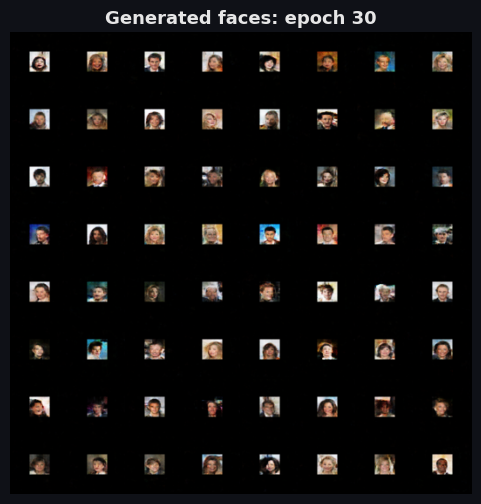

In [ ]:
train(CONFIG["epochs"])

## 5 · Results

### Training curves
GAN losses don't decrease like normal classification losses, since the two networks keep pushing against each other.
What we want is *balance*: `D(x)` a bit above 0.5, `D(G(z))` a bit below, and no runaway divergence.

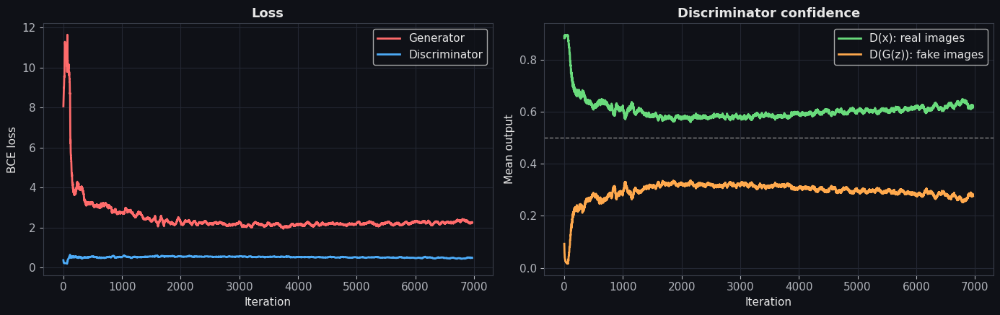

In [ ]:
def smooth(x, k=50):
    x = np.asarray(x, dtype=float)
    return np.convolve(x, np.ones(k) / k, mode="valid") if len(x) > k else x

fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))

axes[0].plot(smooth(history["g_loss"]), color="#ff6b6b", lw=2, label="Generator")
axes[0].plot(smooth(history["d_loss"]), color="#4dabf7", lw=2, label="Discriminator")
axes[0].set(title="Loss", xlabel="Iteration", ylabel="BCE loss")
axes[0].legend()

axes[1].plot(smooth(history["d_x"]), color="#69db7c", lw=2, label="D(x): real images")
axes[1].plot(smooth(history["d_gz"]), color="#ffa94d", lw=2, label="D(G(z)): fake images")
axes[1].axhline(0.5, color="#888", ls="--", lw=1)
axes[1].set(title="Discriminator confidence", xlabel="Iteration", ylabel="Mean output")
axes[1].legend()

plt.tight_layout()
plt.savefig(f"{ASSETS_DIR}/loss_curve.png", dpi=150, bbox_inches="tight")
plt.show()

### Real vs. generated
Left: real CelebA faces. Right: faces that never existed, produced by the trained generator.

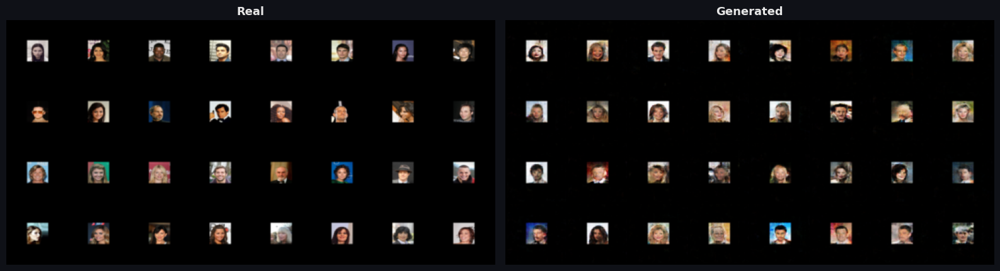

In [ ]:
generator.eval()
with torch.no_grad():
    fake_final = generator(fixed_noise).cpu()
generator.train()

def to_img(t):
    return vutils.make_grid(t[:32], nrow=8, padding=2, normalize=True, value_range=(-1, 1)).permute(1, 2, 0).numpy()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(to_img(real_batch)); axes[0].set_title("Real"); axes[0].axis("off")
axes[1].imshow(to_img(fake_final)); axes[1].set_title("Generated"); axes[1].axis("off")
plt.tight_layout()
plt.savefig(f"{ASSETS_DIR}/real_vs_fake.png", dpi=150, bbox_inches="tight")
plt.show()

# hero image for the README
vutils.save_image(fake_final, f"{ASSETS_DIR}/final_samples.png", nrow=8, padding=2,
                  normalize=True, value_range=(-1, 1))

### Watching the generator learn
Every frame below uses the **same 64 noise vectors**, so you can follow individual faces from static to structure.

Saved 30 frames -> assets/training_progress.gif


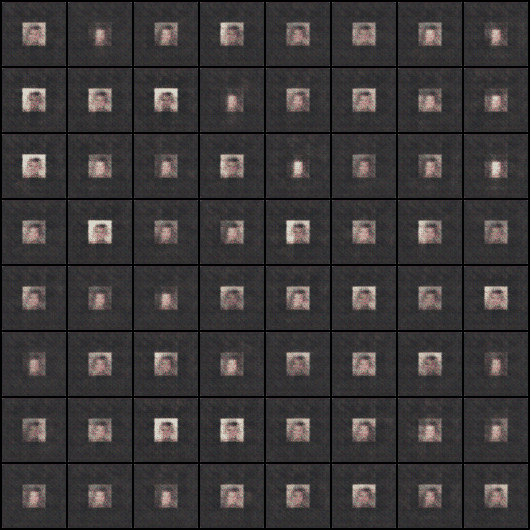

In [ ]:
frame_paths = sorted(glob.glob(f"{SAMPLES_DIR}/epoch_*.png"))
frames = [Image.open(p).convert("RGB") for p in frame_paths]

gif_path = f"{ASSETS_DIR}/training_progress.gif"
frames[0].save(gif_path, save_all=True, append_images=frames[1:] + [frames[-1]] * 8,
               duration=250, loop=0)
print(f"Saved {len(frames)} frames -> {gif_path}")
display(IPyImage(filename=gif_path))

### Latent-space interpolation
If the generator learned something meaningful (not just memorised images), then moving smoothly between two noise vectors
should morph one face into another. We use **spherical interpolation (slerp)**, which suits high-dimensional Gaussian noise
better than a straight line.

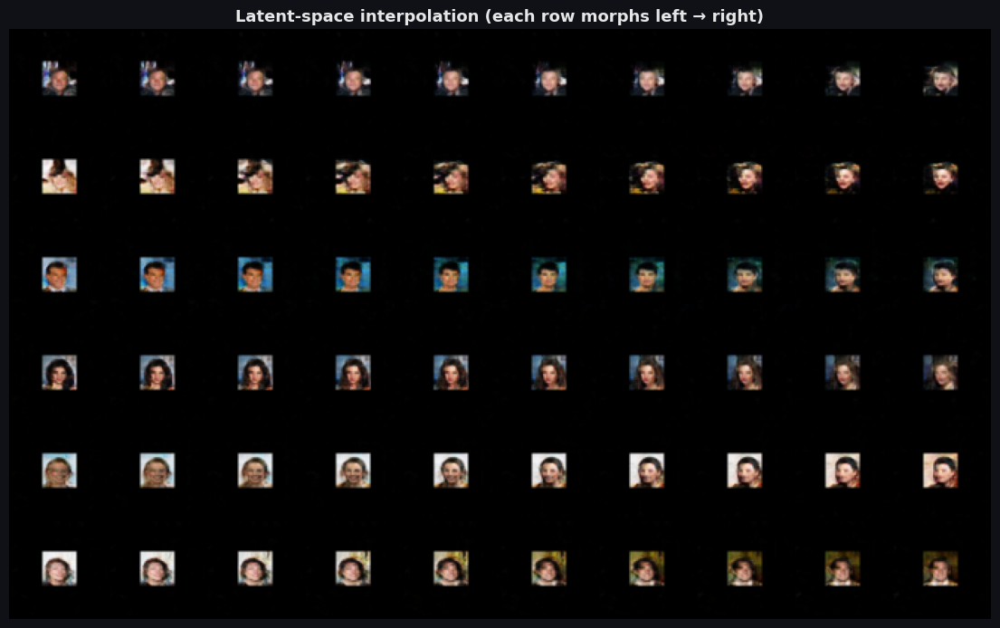

In [ ]:
def slerp(a, b, t):
    # Spherical interpolation between two noise vectors.
    a_n, b_n = a / a.norm(), b / b.norm()
    omega = torch.acos((a_n * b_n).sum().clamp(-1 + 1e-7, 1 - 1e-7))
    so = torch.sin(omega)
    return (torch.sin((1.0 - t) * omega) / so) * a + (torch.sin(t * omega) / so) * b


set_seed(7)
n_rows, n_steps = 6, 10
rows = []
for _ in range(n_rows):
    z_a = torch.randn(CONFIG["z_dim"], device=device)
    z_b = torch.randn(CONFIG["z_dim"], device=device)
    rows.append(torch.stack([slerp(z_a, z_b, t) for t in np.linspace(0, 1, n_steps)]))
z_interp = torch.cat(rows)

generator.eval()
with torch.no_grad():
    interp_imgs = generator(z_interp).cpu()
generator.train()

show_grid(interp_imgs, "Latent-space interpolation (each row morphs left → right)",
          nrow=n_steps, save_path=f"{ASSETS_DIR}/latent_interpolation.png", figsize=(14, 9))

### Generate new faces from the saved model
Load the weights and sample as many faces as you like. No retraining needed.

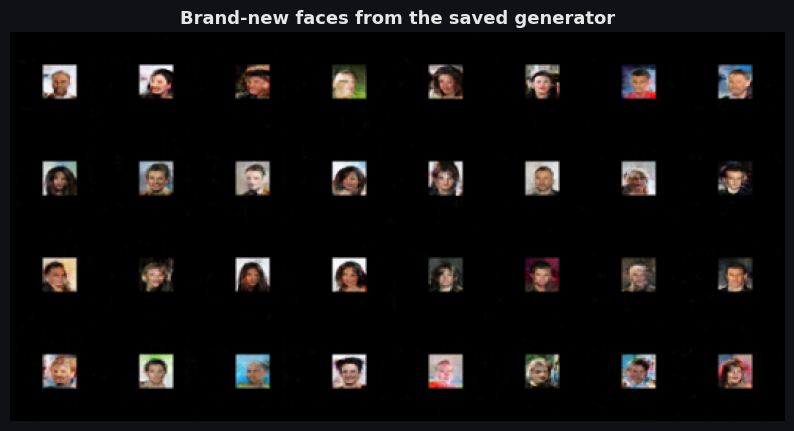

In [ ]:
g = Generator(CONFIG["z_dim"]).to(device)
g.load_state_dict(torch.load(f"{CKPT_DIR}/generator_latest.pt", map_location=device))
g.eval()

with torch.no_grad():
    new_faces = g(torch.randn(32, CONFIG["z_dim"], device=device)).cpu()
show_grid(new_faces, "Brand-new faces from the saved generator", nrow=8, figsize=(10, 5.5))

In [ ]:
# Optional (Colab): bundle the figures so you can drop them straight into your GitHub repo.
shutil.make_archive("assets", "zip", ASSETS_DIR)
try:
    from google.colab import files
    files.download("assets.zip")
except ImportError:
    print("Figures saved in ./assets and ./assets.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 6 · Takeaways & next steps

**What I learned**
- The architecture matters enormously: swapping dense layers for convolutions is what takes a GAN from noise to faces.
- A fixed noise vector turns training into a visual progress bar.
- GAN losses are not a quality metric: watch `D(x)` / `D(G(z))` balance and, above all, *look at the samples*.

**Ideas to push it further**
- Train longer (50+ epochs) or on the full 200k-image CelebA
- Move to **WGAN-GP** or **spectral normalisation** for more stable training
- Quantify quality with **FID** (Fréchet Inception Distance)
- Go up to 128×128 with extra layers, or make it *conditional* (e.g. on smiling / glasses attributes)

**References**
- Goodfellow et al., *Generative Adversarial Networks*, 2014
- Radford, Metz & Chintala, *Unsupervised Representation Learning with Deep Convolutional GANs*, 2015
- Liu et al., *Deep Learning Face Attributes in the Wild* (CelebA), ICCV 2015